In [1]:
import datasets

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from glob import glob
from pathlib import Path

In [3]:
participants = [Path(file).name for file in glob('./data/ecg_preprocessed/*.csv')]

In [4]:
dataset = datasets.load_dataset(
    './data/ecg_preprocessed', 
    train_participants=participants[:5],
    trust_remote_code=True,
    num_proc=8
)['fit']

In [5]:
n_window = 60 * 1000
sampling_rate = 1000

In [6]:
window_shift_size = 0.25
step_size = int(window_shift_size * sampling_rate)

### Frequencies

In [7]:
import neurokit2 as nk

In [8]:
def encode(samples):
    baseline = ['Sitting', 'Recov1', 'Recov2', 'Recov3', 'Recov4', 'Recov5']#, 'Recov6']
    mental_stress = ['TA', 'SSST_Sing_countdown', 'Pasat', 'Raven', 'TA_repeat', 'Pasat_repeat']
    high_physical_stress = ['Treadmill1', 'Treadmill2', 'Treadmill3', 'Treadmill4', 'Walking_fast_pace', 'Cycling', 'stairs_up_and_down']
    moderate_physical_stress = ['Walking_own_pace', 'Dishes', 'Vacuum']
    low_physical_stress = ['Standing', 'Lying_supine', 'Recov_standing']
    
    def encode_multiclass(label):
        if label in baseline:
            return 0
        elif label in mental_stress:
            return 1
        elif label in high_physical_stress:
            return 2
        elif label in moderate_physical_stress:
            return 3
        elif label in low_physical_stress:
            return 4
        else:
            return -1
        
    return {
        'label': [encode_multiclass(label) for label in samples['category']],
    }


In [9]:
dataset = dataset.map(encode, batched=True, batch_size=2048, num_proc=4)

Map (num_proc=4): 100%|██████████| 42736000/42736000 [00:35<00:00, 1206669.82 examples/s]


In [10]:
import matplotlib.pyplot as plt

In [11]:
plt.rcParams["figure.figsize"] = (20, 10)

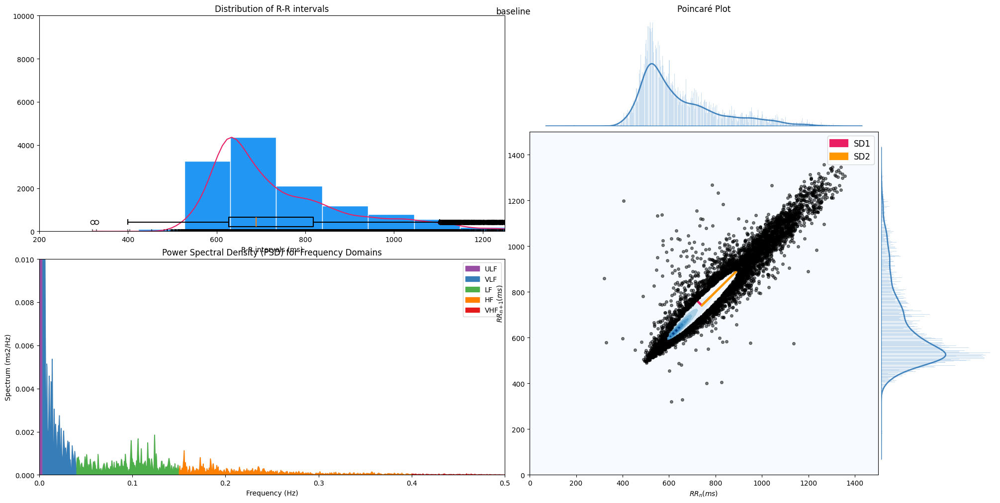

In [18]:
for idx, category in enumerate(['baseline']):
    ds = dataset.filter(lambda x, idx: x['label'] == idx, num_proc=8, fn_kwargs={'idx': idx})['signal']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    hrv(peaks, sampling_rate=sampling_rate, show=True)
    plt.suptitle(category)

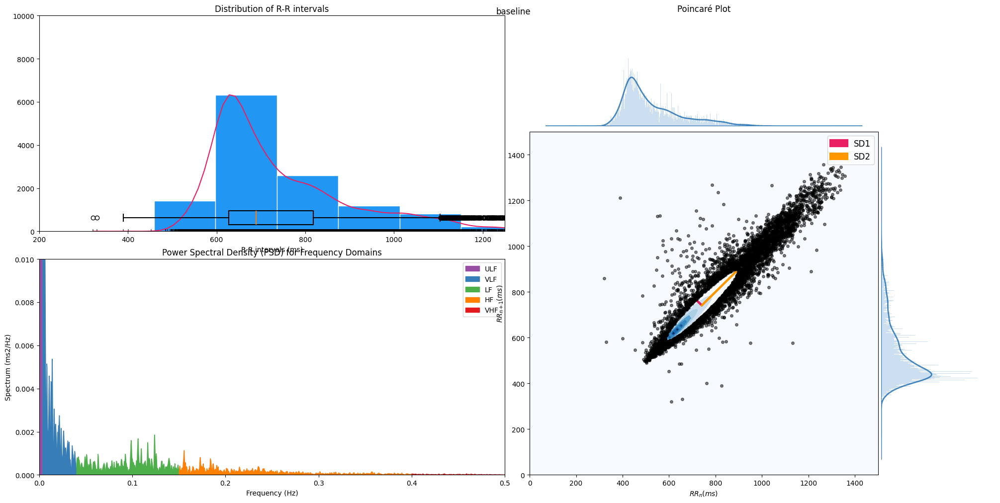

In [19]:
for idx, category in enumerate(['baseline']):
    ds = dataset.filter(lambda x, idx: x['label'] == idx, num_proc=8, fn_kwargs={'idx': idx})['ECG_Clean']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    hrv(peaks, sampling_rate=sampling_rate, show=True)
    plt.suptitle(category)

Filter (num_proc=8): 100%|██████████| 42736000/42736000 [01:11<00:00, 601492.12 examples/s]


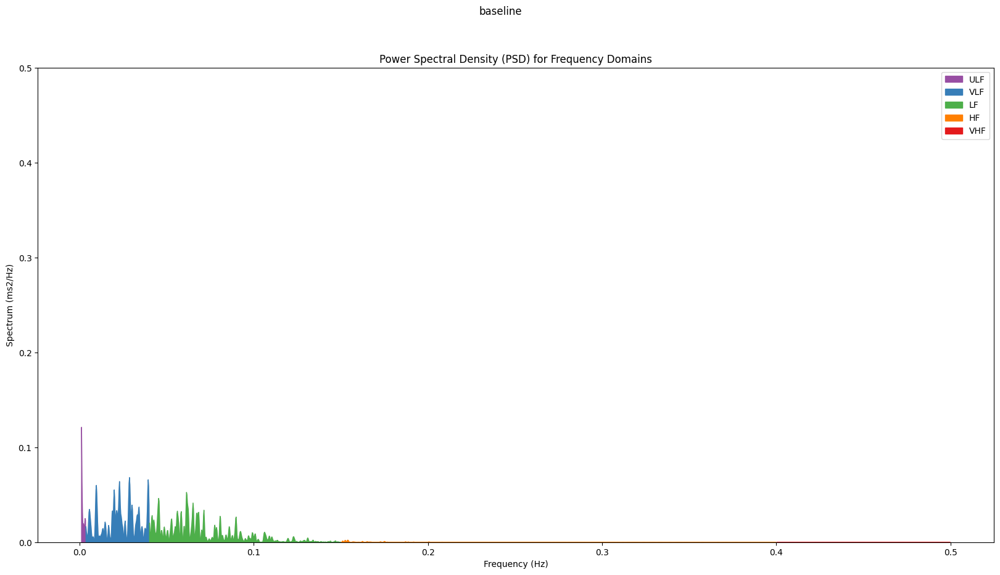

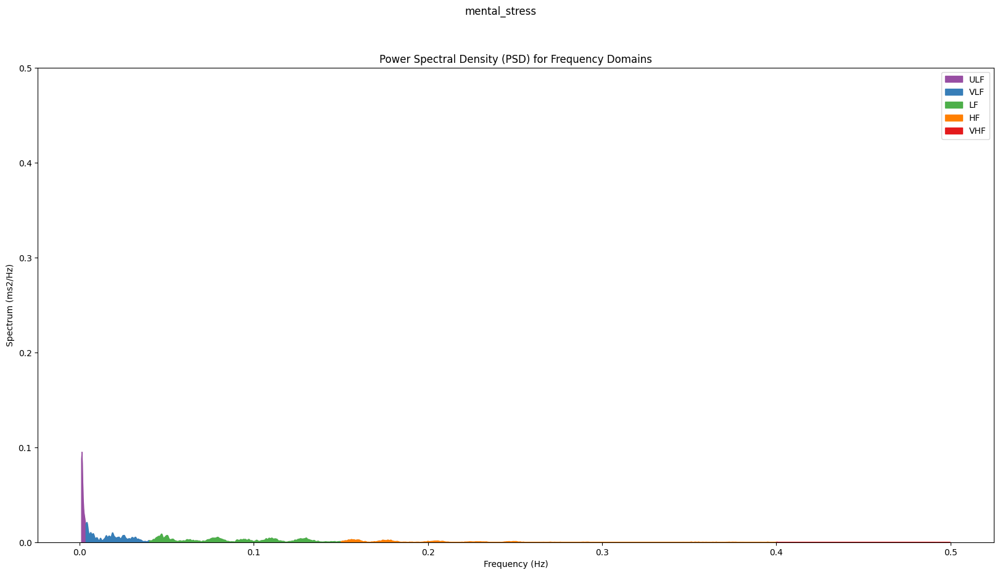

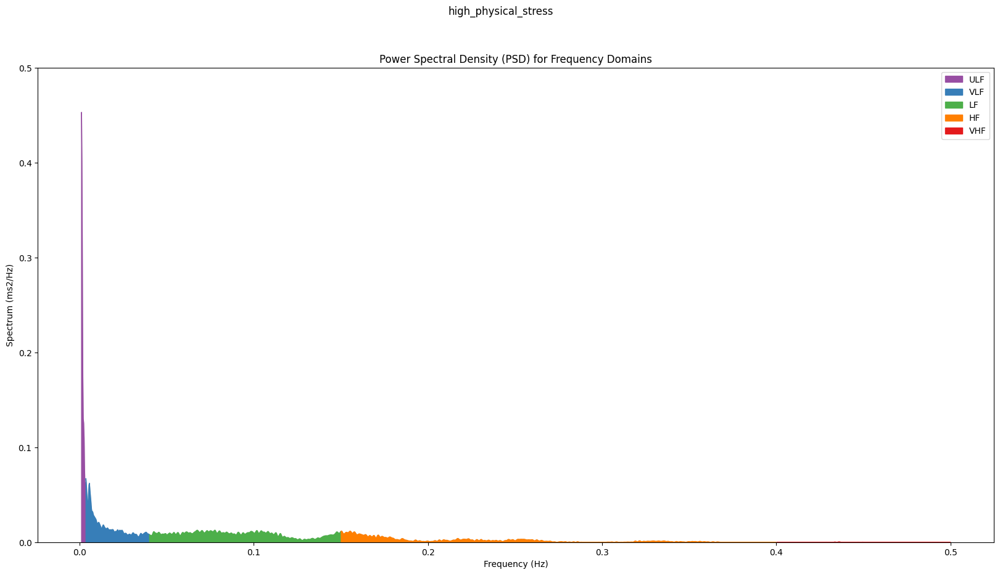

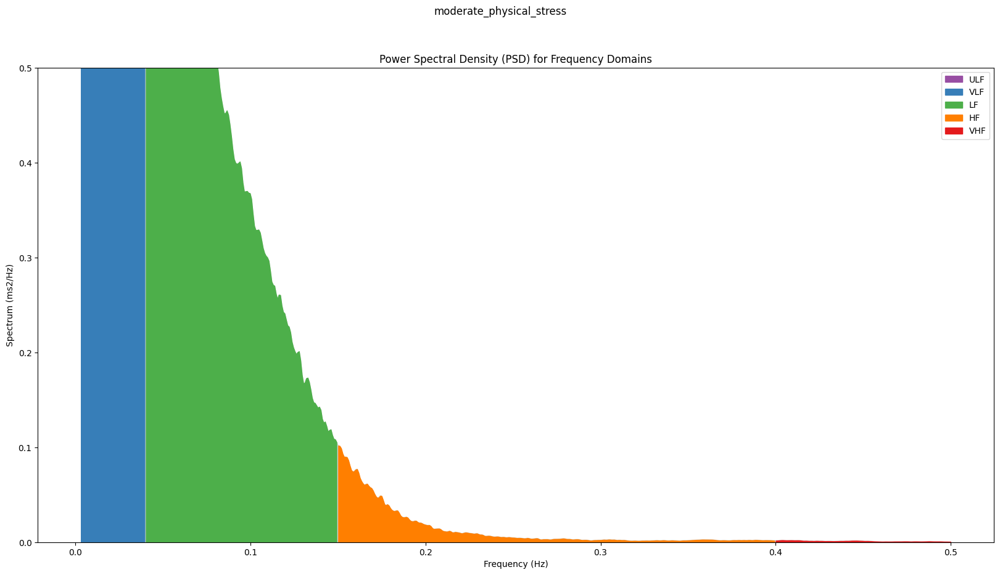

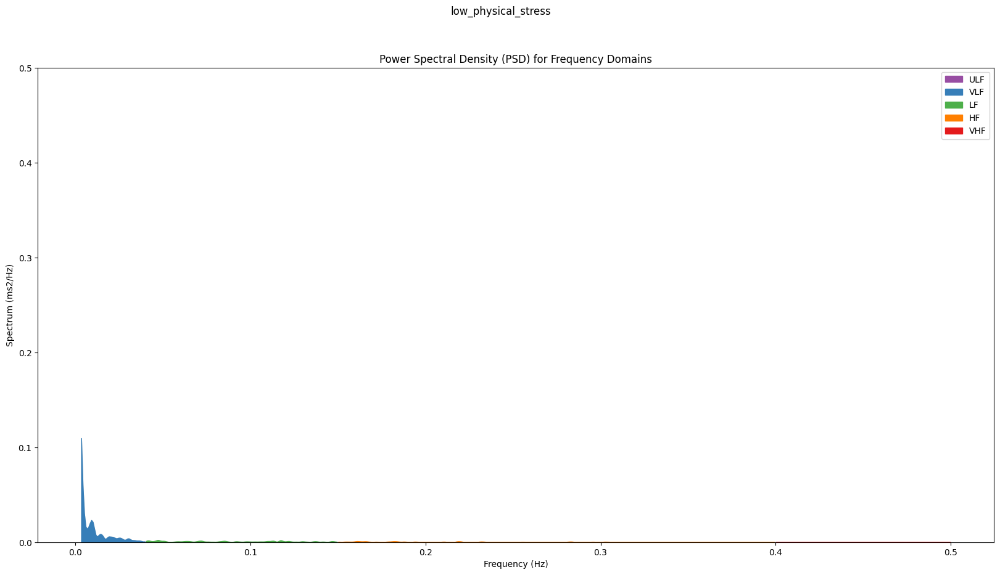

In [20]:
for idx, category in enumerate(['baseline', 'mental_stress', 'high_physical_stress', 'moderate_physical_stress', 'low_physical_stress']):
    ds = dataset.filter(lambda x, idx: x['label'] == idx, num_proc=8, fn_kwargs={'idx': idx})['ECG_Clean']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    nk.hrv_frequency(peaks, sampling_rate=sampling_rate, show=True, normalize=True)
    plt.suptitle(category)
    plt.ylim(0, 0.5)

In [16]:
plt.rcParams["figure.figsize"] = (20, 10)

In [13]:
import matplotlib.gridspec as gs
import matplotlib.pyplot as plt
import pandas as pd

from neurokit2.hrv.hrv_frequency import _hrv_frequency_show, hrv_frequency
from neurokit2.hrv.hrv_nonlinear import _hrv_nonlinear_show, hrv_nonlinear
from neurokit2.hrv.hrv_rsa import hrv_rsa
from neurokit2.hrv.hrv_time import hrv_time
from neurokit2.hrv.hrv_utils import _hrv_format_input
from neurokit2.hrv.intervals_process import intervals_process

In [14]:
from neurokit2.stats.density import density
from neurokit2.stats.rescale import rescale

In [15]:
import numpy as np
import scipy.stats as st

def summary_plot(x, errorbars=0, **kwargs):
    """**Descriptive plot**

    Visualize a distribution with density, histogram, boxplot and rugs plots all at once.

    Examples
    --------
    .. ipython:: python

      import neurokit2 as nk
      import numpy as np

      x = np.random.normal(size=100)
      @savefig p_summary1.png scale=100%
      fig = nk.summary_plot(x)
      @suppress
      plt.close()

    """

    if "ax" in kwargs:
        fig = None
        ax = kwargs.get("ax")
        kwargs.pop("ax")
    else:
        fig, ax = plt.subplots()

    # Histogram
    counts, bins = np.histogram(x, **kwargs)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    if errorbars > 0:
        samperr = np.std(counts) / np.sqrt(counts) * (st.norm.ppf(1-(1-errorbars)/2))
        ax.errorbar(bin_centers, counts, yerr=samperr, ecolor="#FF8C00", fmt='.', capsize=5, capthick=2)
    ax.hist(bins[:-1], bins, weights=counts, color="#2196F3", edgecolor="white", zorder=1, **kwargs)

    # Density
    x_axis, y_axis = density(x, **kwargs)
    y_axis = rescale(y_axis, to=[0, np.max(counts)])
    ax.plot(x_axis, y_axis, color="#E91E63", linewidth=1.5, zorder=2, **kwargs)

    # Points
    y_axis = np.full(len(x), 0.1)
    ax.scatter(x, y_axis, c="black", alpha=0.5, marker="|", zorder=3, **kwargs)

    # Boxplot
    ax.boxplot(
        x,
        vert=False,
        positions=[np.max(counts) / 10],
        widths=np.max(counts) / 10,
        manage_ticks=False,
        boxprops=dict(linewidth=1.5),
        medianprops=dict(linewidth=1.5),
        whiskerprops=dict(linewidth=1.5),
        capprops=dict(linewidth=1.5),
        zorder=4,
        **kwargs
    )

    ax.set_xlim(200, 1250)
    ax.set_ylim(0, 10000)

    return fig

In [16]:
# =============================================================================
# Plot
# =============================================================================
def _hrv_plot(peaks, out, sampling_rate=1000, interpolation_rate=100, **kwargs):

    fig = plt.figure(constrained_layout=False)
    spec = gs.GridSpec(ncols=2, nrows=2, height_ratios=[1, 1], width_ratios=[1, 1])

    # Arrange grids
    ax_distrib = fig.add_subplot(spec[0, :-1])
    ax_distrib.set_xlabel("R-R intervals (ms)")
    ax_distrib.set_title("Distribution of R-R intervals")

    ax_psd = fig.add_subplot(spec[1, :-1])

    spec_within = gs.GridSpecFromSubplotSpec(4, 4, subplot_spec=spec[:, -1], wspace=0.025, hspace=0.05)
    ax_poincare = fig.add_subplot(spec_within[1:4, 0:3])
    ax_marg_x = fig.add_subplot(spec_within[0, 0:3])
    ax_marg_x.set_title("Poincaré Plot")
    ax_marg_y = fig.add_subplot(spec_within[1:4, 3])

    plt.tight_layout(h_pad=0.5, w_pad=0.5)

    # Distribution of RR intervals
    rri, rri_time, rri_missing = _hrv_format_input(peaks, sampling_rate=sampling_rate)
    ax_distrib = summary_plot(rri, ax=ax_distrib, **kwargs)

    # Poincare plot
    out.columns = [col.replace("HRV_", "") for col in out.columns]
    _hrv_nonlinear_show(rri, rri_time=rri_time, rri_missing=rri_missing, out=out, ax=ax_poincare, ax_marg_x=ax_marg_x, ax_marg_y=ax_marg_y)
    ax_poincare.set_xlim(0, 1500)
    ax_poincare.set_ylim(0, 1500)
    ax_poincare.set_facecolor("#F7FBFF")

    # PSD plot
    rri, rri_time, sampling_rate = intervals_process(
        rri, intervals_time=rri_time, interpolate=True, interpolation_rate=interpolation_rate, **kwargs
    )

    frequency_bands = out[["ULF", "VLF", "LF", "HF", "VHF"]]
    _hrv_frequency_show(rri, frequency_bands, sampling_rate=sampling_rate, ax=ax_psd)
    ax_psd.set_xlim(0,0.5)
    ax_psd.set_ylim(0,0.01)

In [17]:
def hrv(peaks, sampling_rate=1000, show=False, **kwargs):
    out = []  # initialize empty container

    # Gather indices
    out.append(hrv_time(peaks, sampling_rate=sampling_rate))
    out.append(hrv_frequency(peaks, sampling_rate=sampling_rate))
    out.append(hrv_nonlinear(peaks, sampling_rate=sampling_rate))

    # Compute RSA if rsp data is available
    if isinstance(peaks, pd.DataFrame):
        if ("RSP_Phase" in peaks.columns) and ("RSP_Phase_Completion" in peaks.columns):
            rsp_signals = peaks[["RSP_Phase", "RSP_Phase_Completion"]]
            rsa = hrv_rsa(peaks, rsp_signals, sampling_rate=sampling_rate)
            out.append(pd.DataFrame([rsa]))

    out = pd.concat(out, axis=1)

    # Plot
    if show:
        if isinstance(peaks, dict):
            peaks = peaks["ECG_R_Peaks"]
        # Indices for plotting
        out_plot = out.copy(deep=False)

        _hrv_plot(peaks, out_plot, sampling_rate, **kwargs)

    return out

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\neurokit2\hrv\hrv_time.py:232: RuntimeWarning: Mean of empty slice
  avg_rri.append(np.nanmean(rri[start_idx:end_idx]))
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


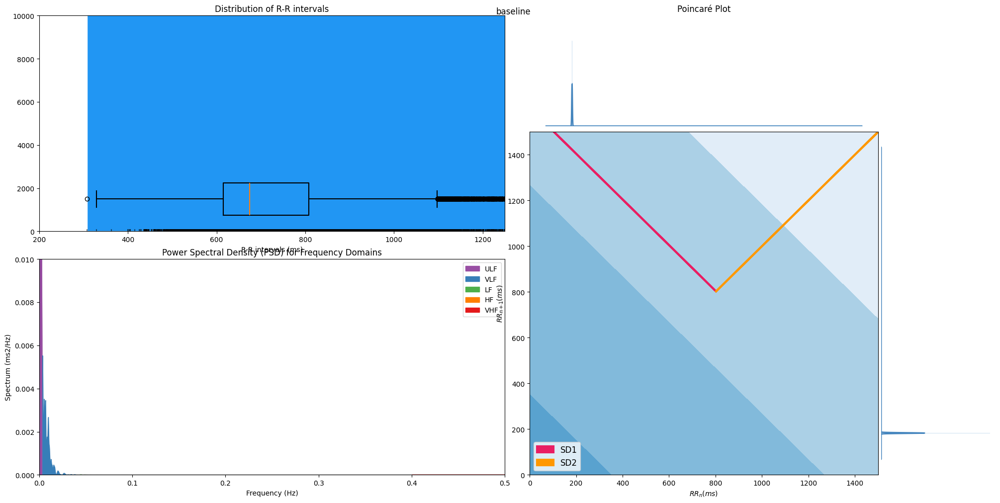

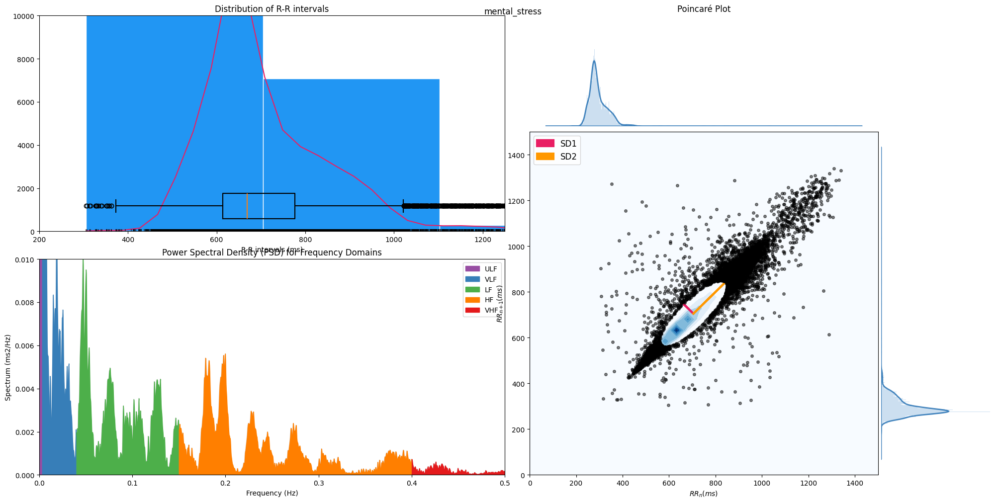

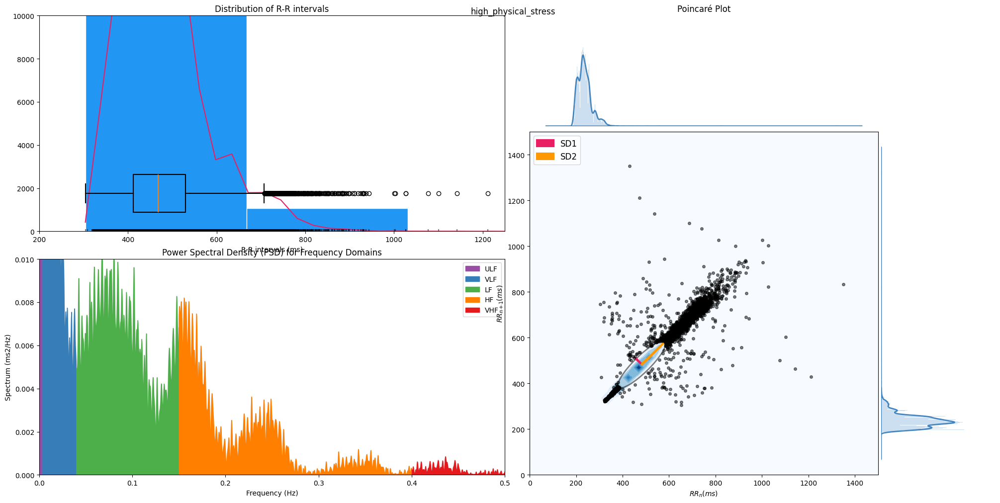

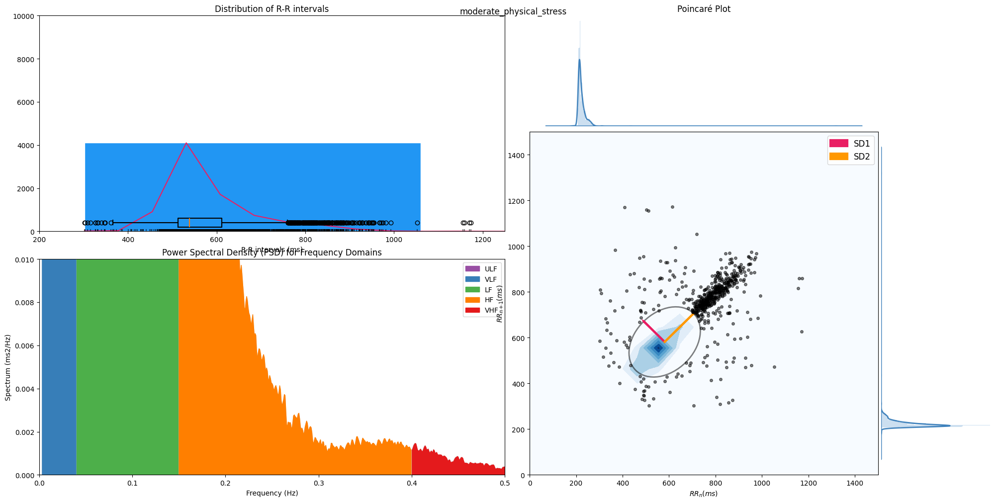

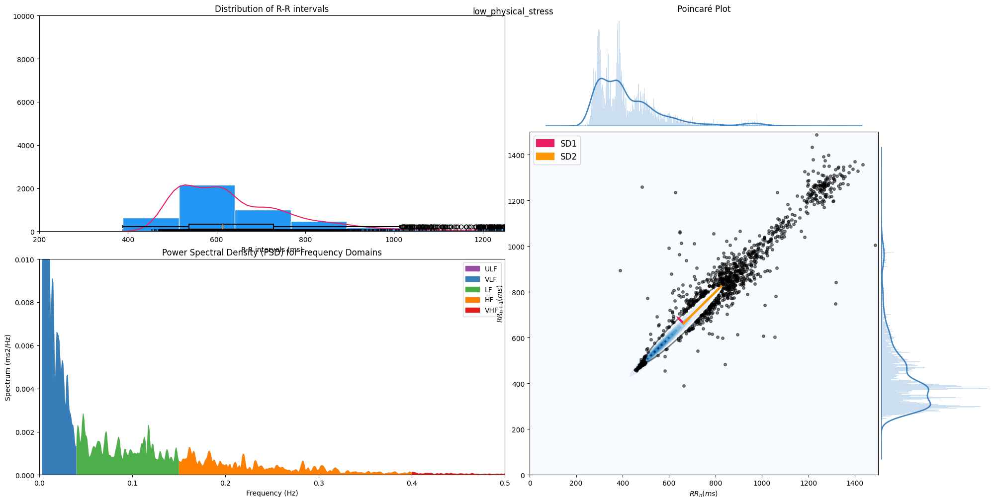

In [63]:
for idx, category in enumerate(['baseline', 'mental_stress', 'high_physical_stress', 'moderate_physical_stress', 'low_physical_stress']):
    ds = dataset.filter(lambda x, idx: x['label'] == idx, num_proc=8, fn_kwargs={'idx': idx})['signal']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    hrv(peaks, sampling_rate=sampling_rate, show=True)
    plt.suptitle(category)

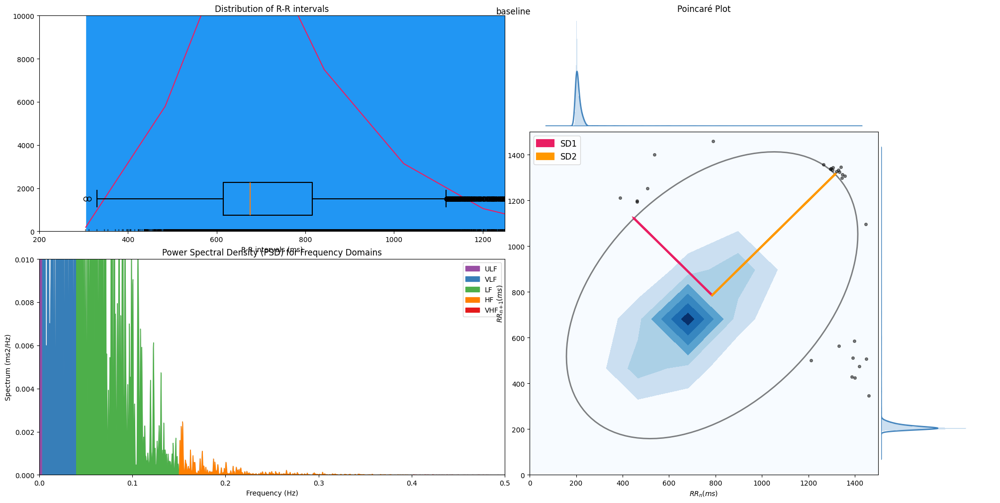

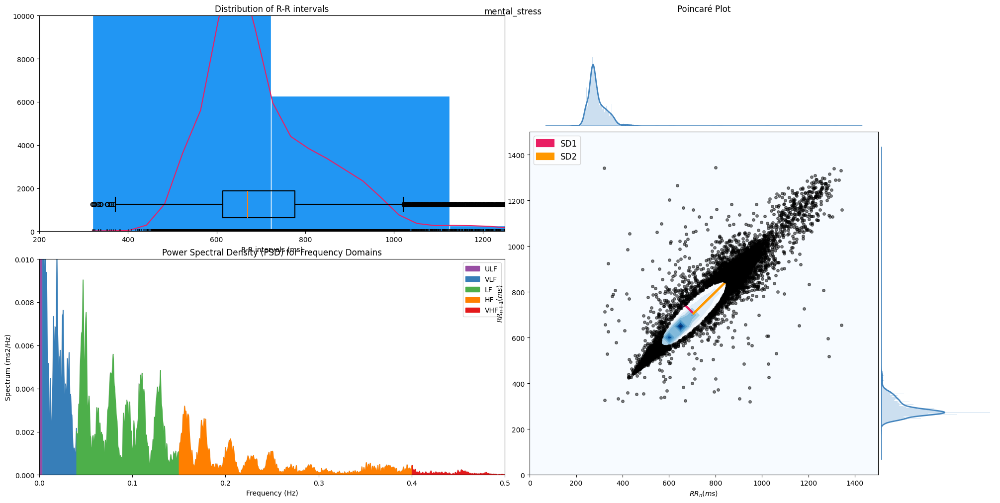

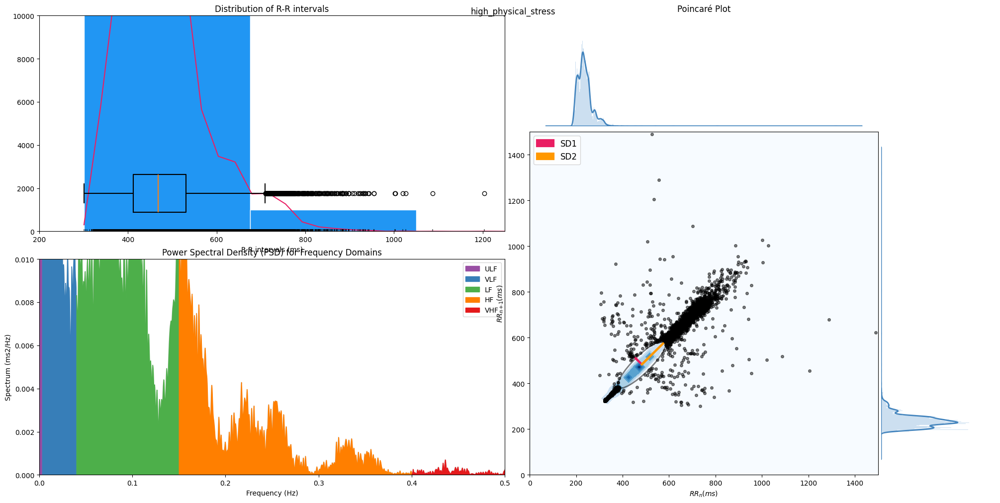

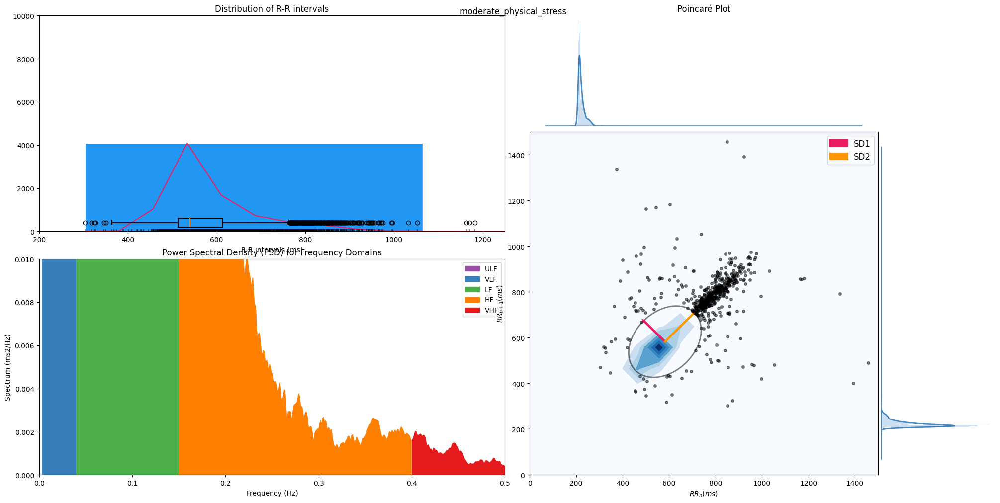

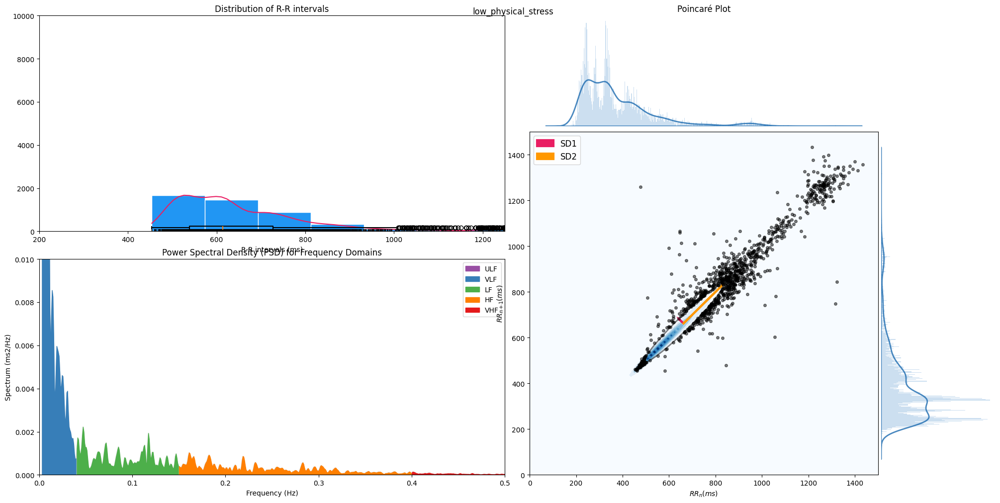

In [64]:
for idx, category in enumerate(['baseline', 'mental_stress', 'high_physical_stress', 'moderate_physical_stress', 'low_physical_stress']):
    ds = dataset.filter(lambda x, idx: x['label'] == idx, num_proc=8, fn_kwargs={'idx': idx})['ECG_Clean']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    hrv(peaks, sampling_rate=sampling_rate, show=True)
    plt.suptitle(category)

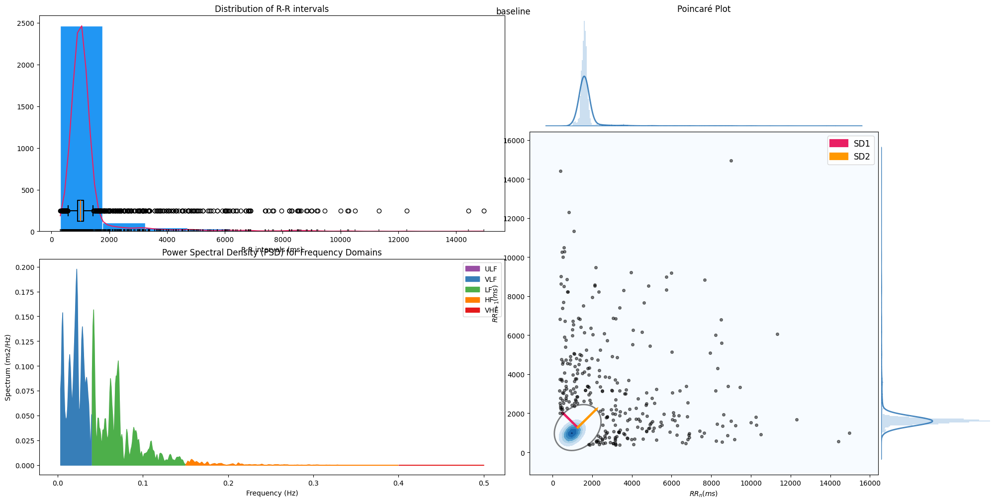

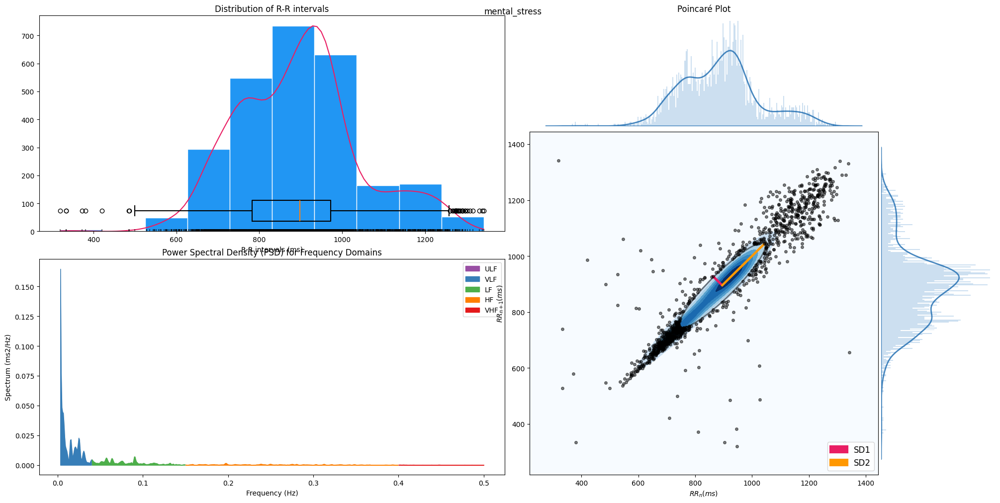

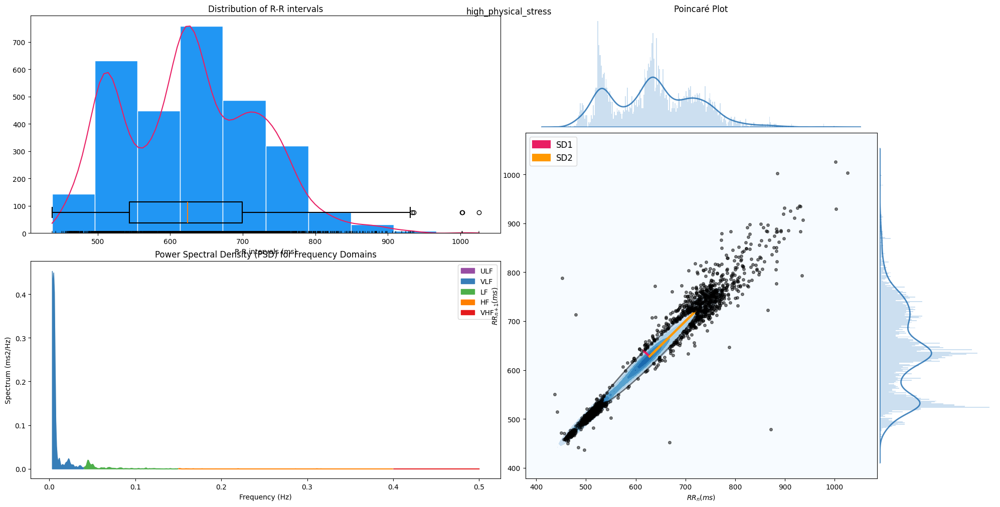

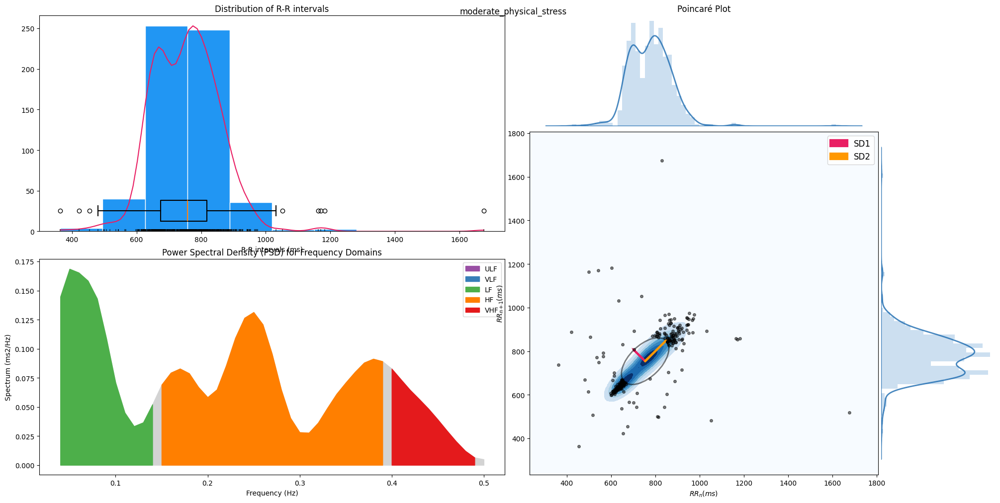

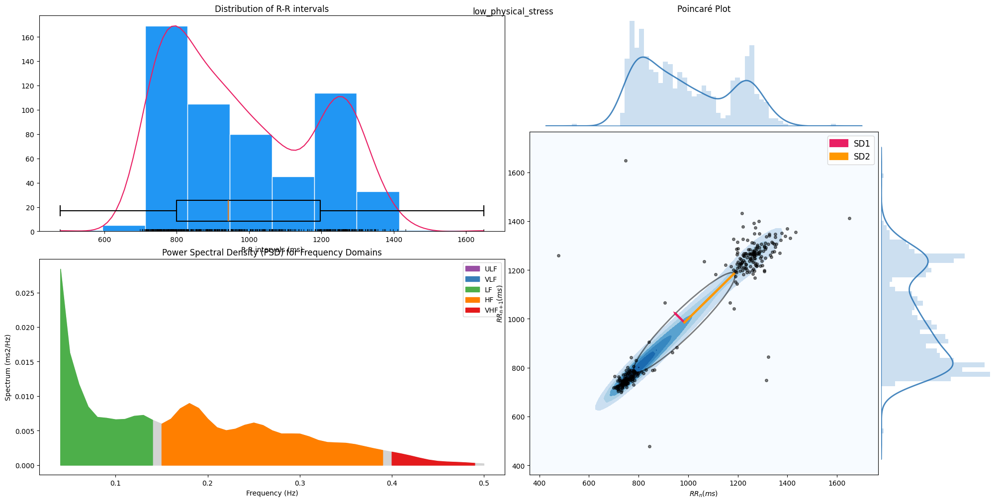

In [ ]:
for idx, category in enumerate(['baseline', 'mental_stress', 'high_physical_stress', 'moderate_physical_stress', 'low_physical_stress']):
    peaks, _ = nk.ecg_peaks(df[df['label'] == idx]['ECG_Clean'], sampling_rate=sampling_rate)
    nk.hrv(peaks, sampling_rate=sampling_rate, show=True)
    plt.suptitle(category)

In [26]:
import numpy as np
import pandas as pd

In [35]:
dataset

Dataset({
    features: ['timestamp', 'signal', 'signal_normalised', 'subject_id', 'category', 'code', 'ECG_Raw', 'ECG_Clean', 'ECG_Rate', 'ECG_Quality', 'ECG_R_Peaks', 'ECG_P_Peaks', 'ECG_P_Onsets', 'ECG_P_Offsets', 'ECG_Q_Peaks', 'ECG_R_Onsets', 'ECG_R_Offsets', 'ECG_S_Peaks', 'ECG_T_Peaks', 'ECG_T_Onsets', 'ECG_T_Offsets', 'ECG_Phase_Atrial', 'ECG_Phase_Completion_Atrial', 'ECG_Phase_Ventricular', 'ECG_Phase_Completion_Ventricular', 'label'],
    num_rows: 42736000
})

In [ ]:
for category in pd.DataFrame({ 'category': dataset['category'] })['category'].unique()[1:]:
    ds = dataset.filter(lambda x, category: x['category'] == category, num_proc=8, fn_kwargs={'category': category})['signal']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    nk.hrv_frequency(peaks, sampling_rate=sampling_rate, show=True, normalize=True)
    plt.suptitle(category)
    plt.ylim(0, 0.5)

In [ ]:
for category in pd.DataFrame({ 'category': dataset['category'] })['category'].unique()[1:]:
    ds = dataset.filter(lambda x, category: x['category'] == category, num_proc=8, fn_kwargs={'category': category})['ECG_Clean']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    nk.hrv_frequency(peaks, sampling_rate=sampling_rate, show=True, normalize=True)
    plt.suptitle(category)
    plt.ylim(0, 0.5)

In [30]:
pd.DataFrame({ 'category': dataset['category'] })['category'].unique()[1:]

array(['Lying_supine', 'Standing', 'Sitting', 'TA', 'Recov1',
       'SSST_Sing_countdown', 'Recov2', 'Pasat', 'Recov3', 'Raven',
       'Walking_own_pace', 'Walking_fast_pace', 'Cycling',
       'stairs_up_and_down', 'Recov_standing', 'Dishes', 'Vacuum',
       'Recov4', 'TA_repeat', 'Recov5', 'Pasat_repeat', 'Treadmill1',
       'Treadmill2', 'Treadmill3', 'Treadmill4', 'Recov6'], dtype=object)

C:\Users\Admin\AppData\Local\Temp\ipykernel_24820\2668027397.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(constrained_layout=False)
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\neurokit2\hrv\hrv_time.py:232: RuntimeWarning: Mean of empty slice
  avg_rri.append(np.nanmean(rri[start_idx:end_idx]))
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


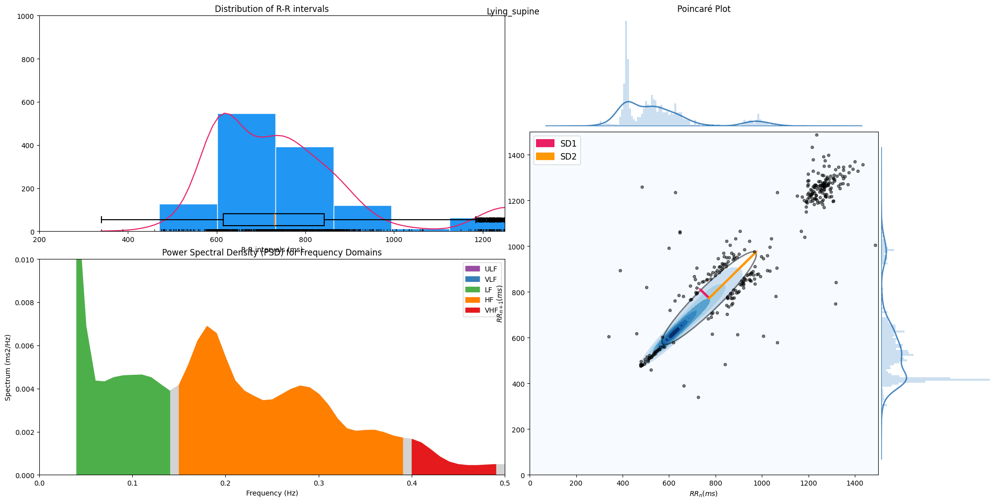

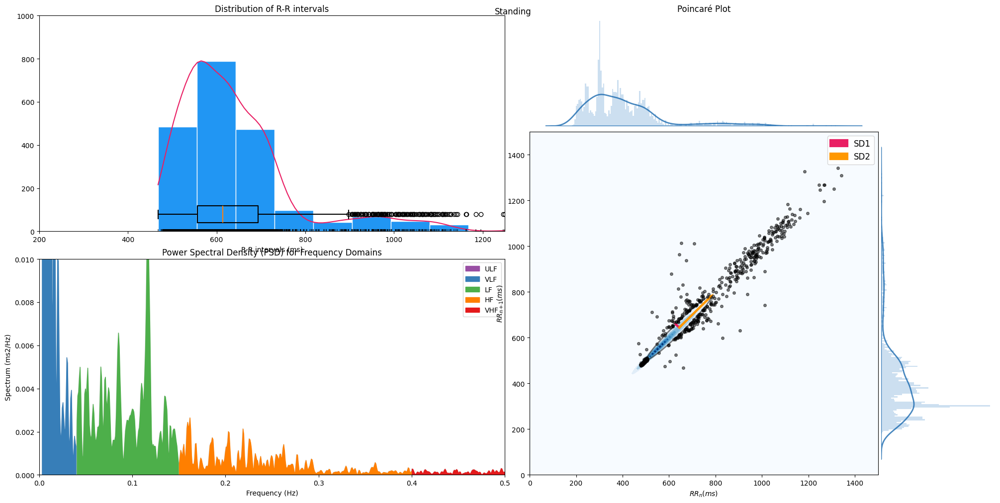

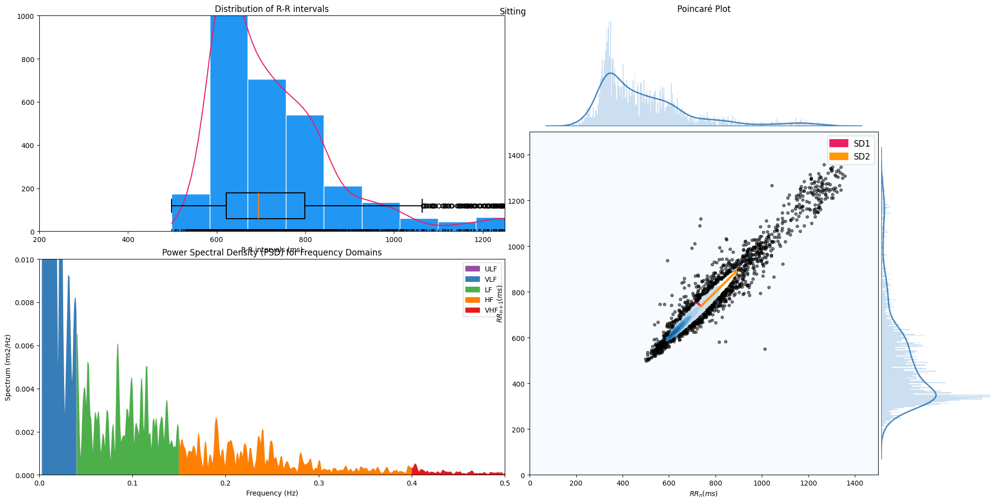

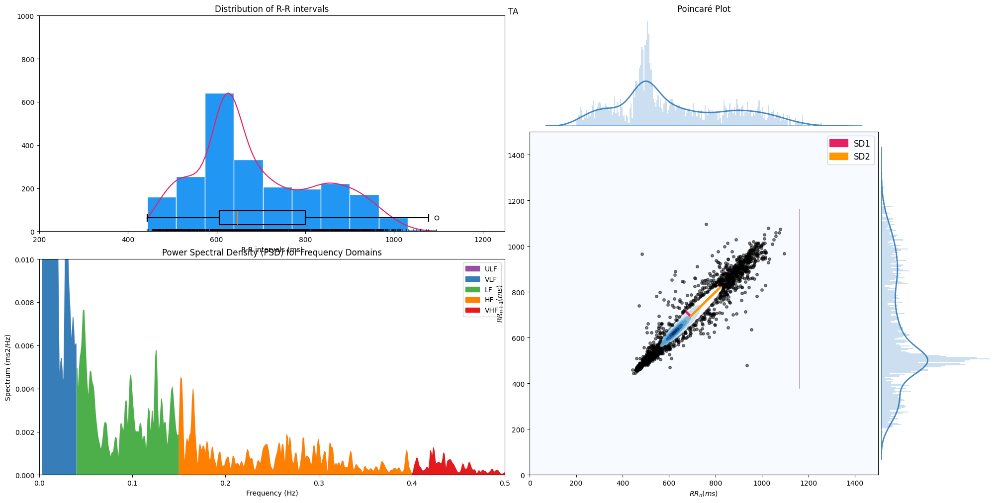

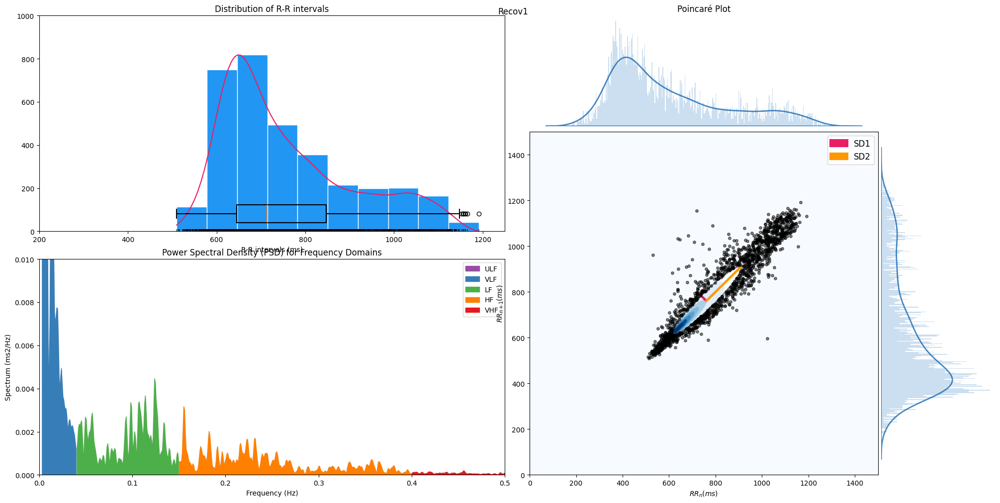

...

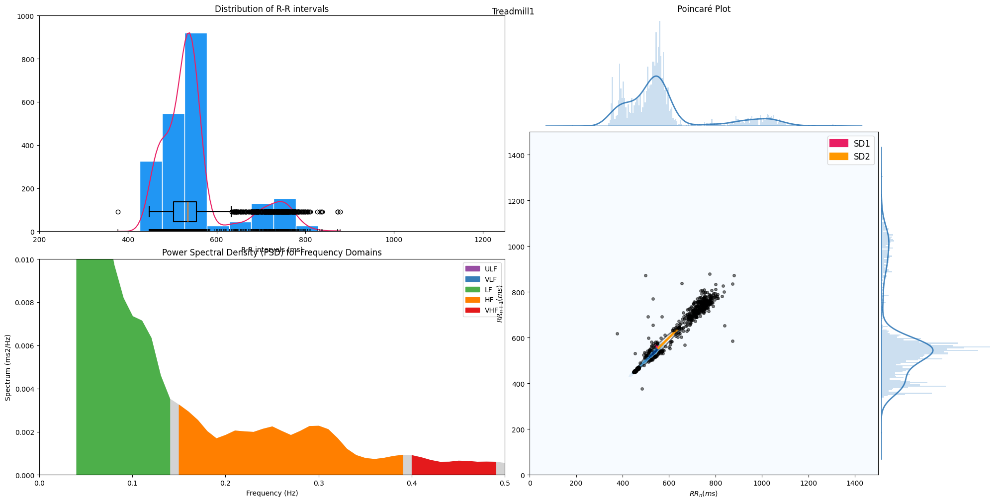

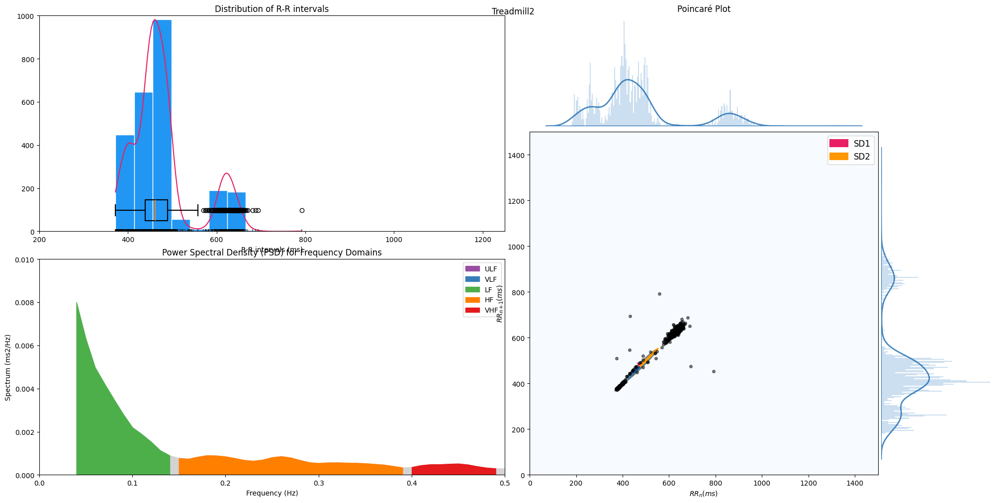

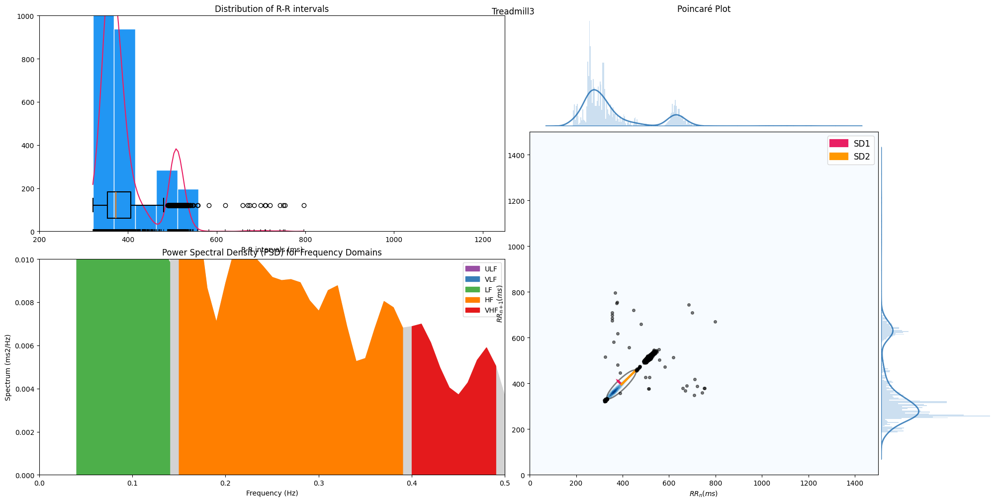

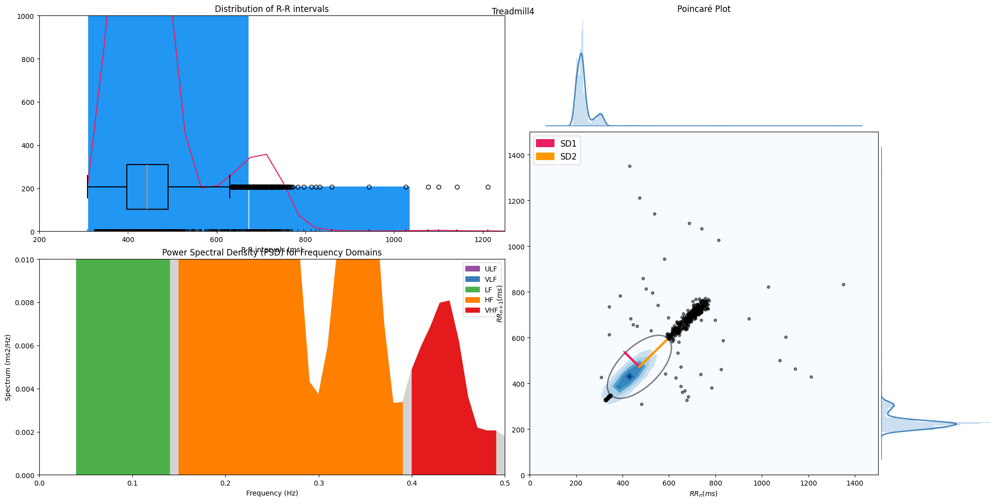

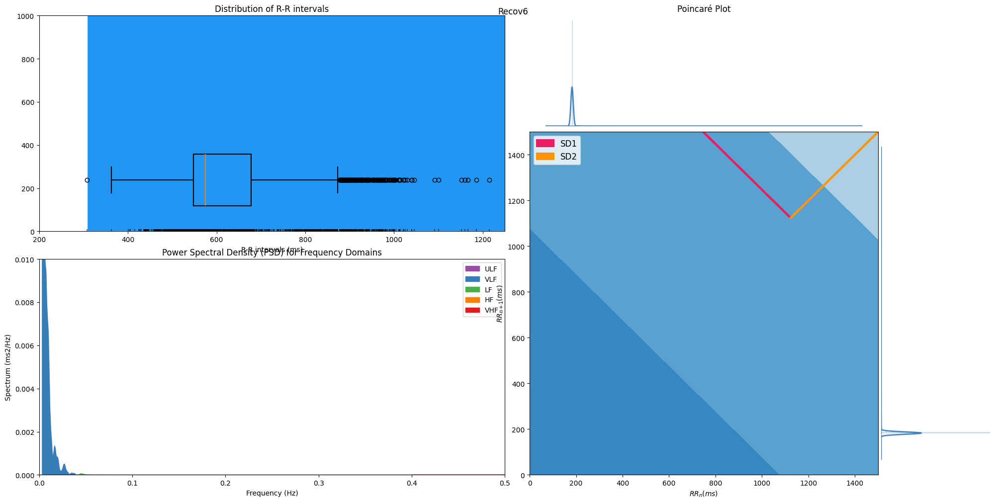

In [56]:
for category in pd.DataFrame({ 'category': dataset['category'] })['category'].unique()[1:]:
    ds = dataset.filter(lambda x, category: x['category'] == category, num_proc=8, fn_kwargs={'category': category})['signal']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    hrv(peaks, sampling_rate=1000, show=True)
    plt.suptitle(category)

C:\Users\Admin\AppData\Local\Temp\ipykernel_24820\2668027397.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(constrained_layout=False)


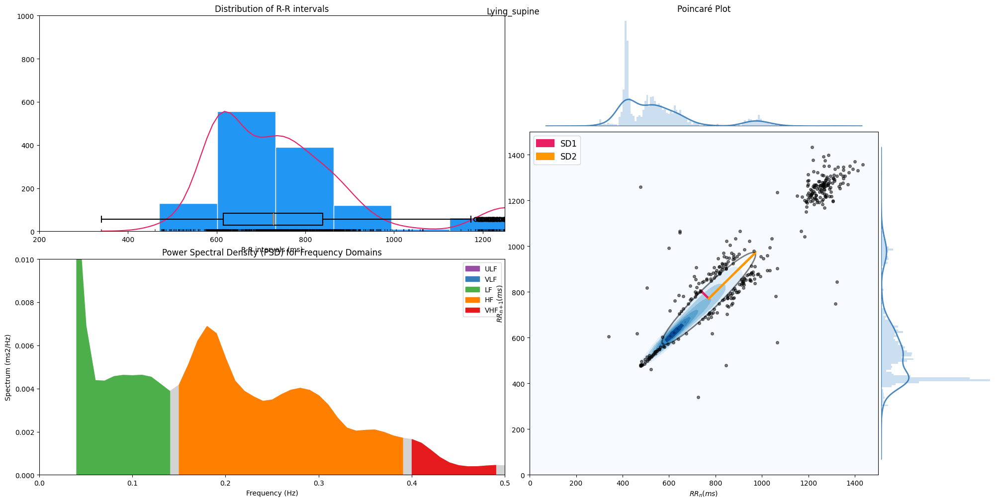

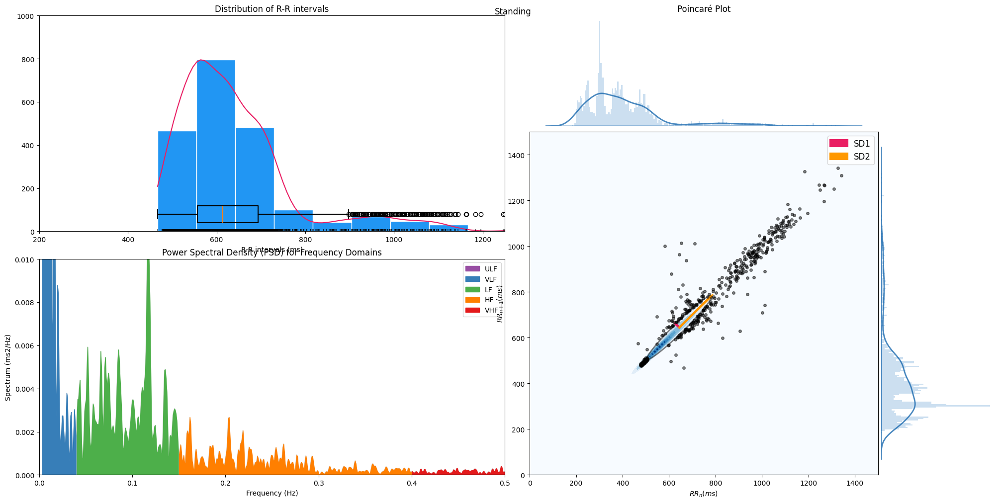

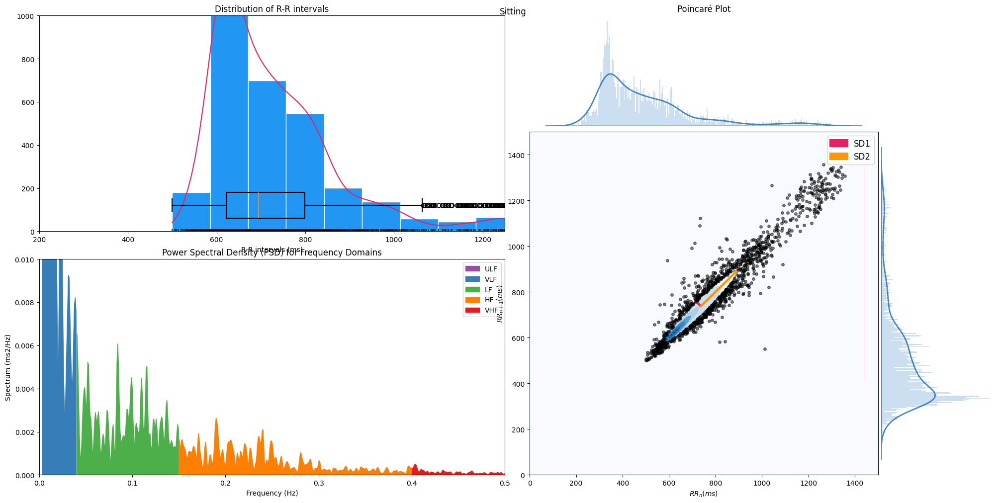

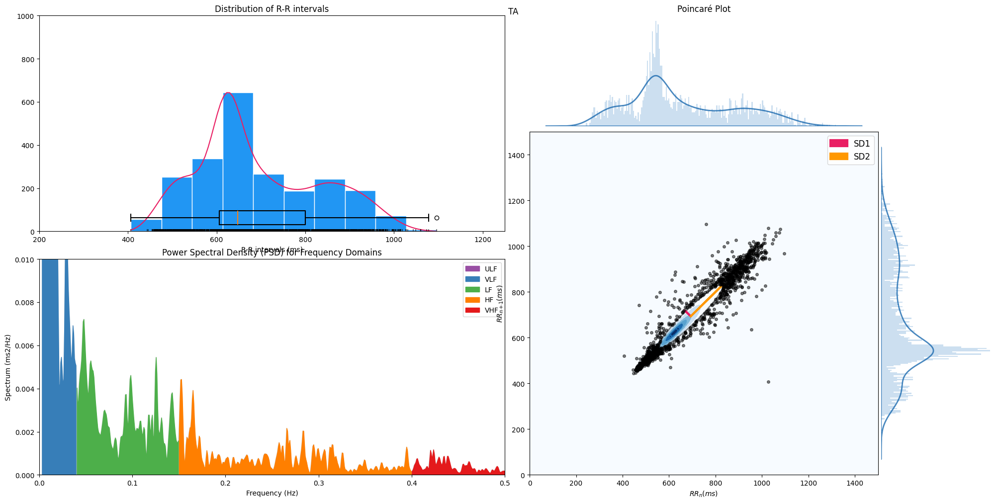

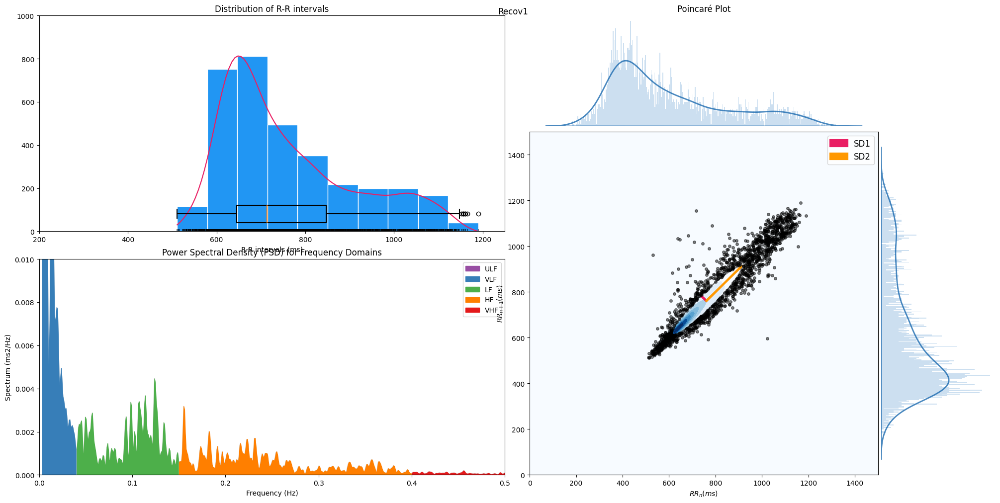

...

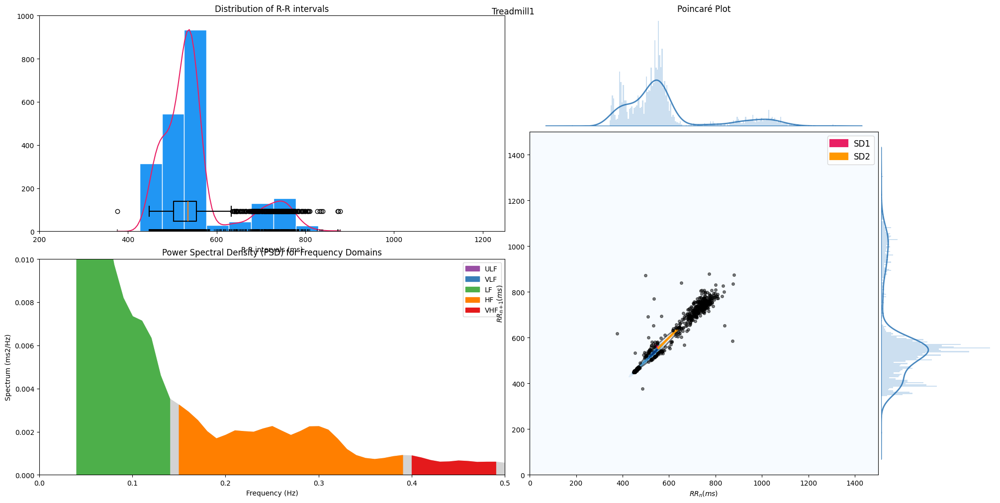

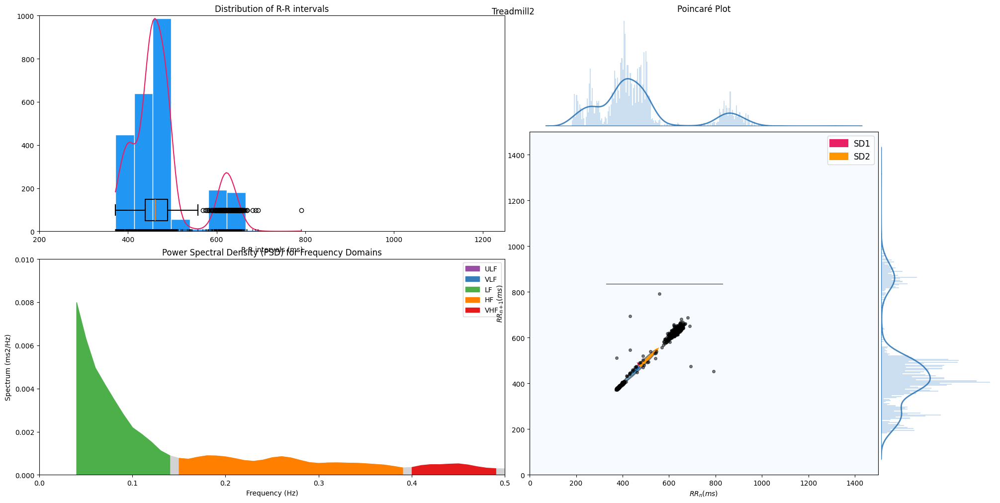

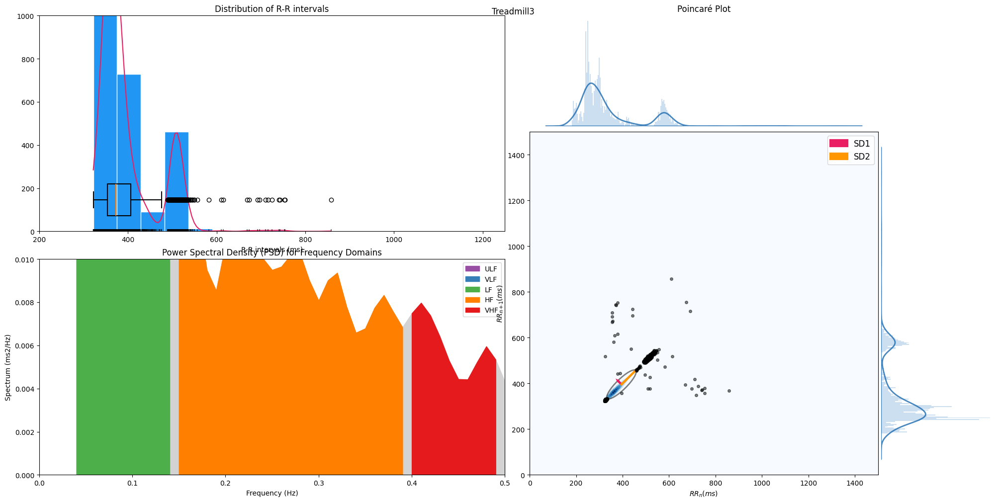

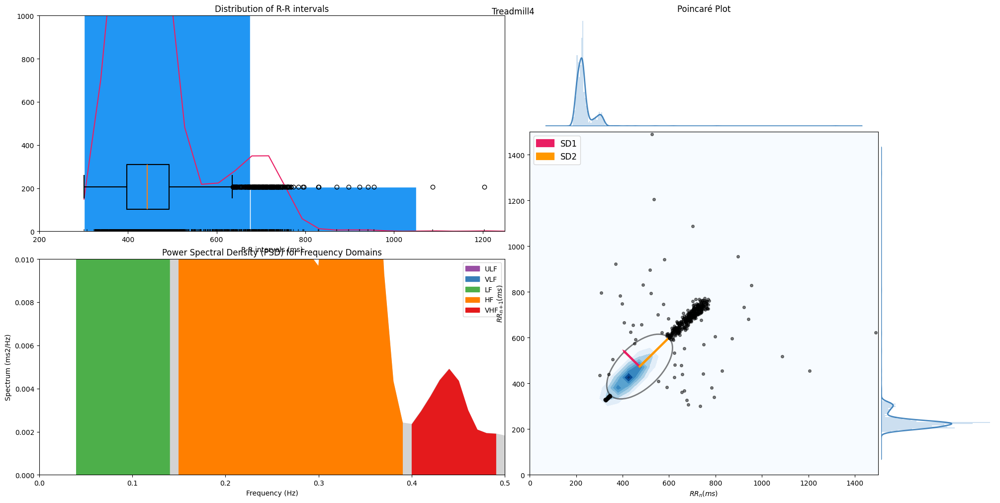

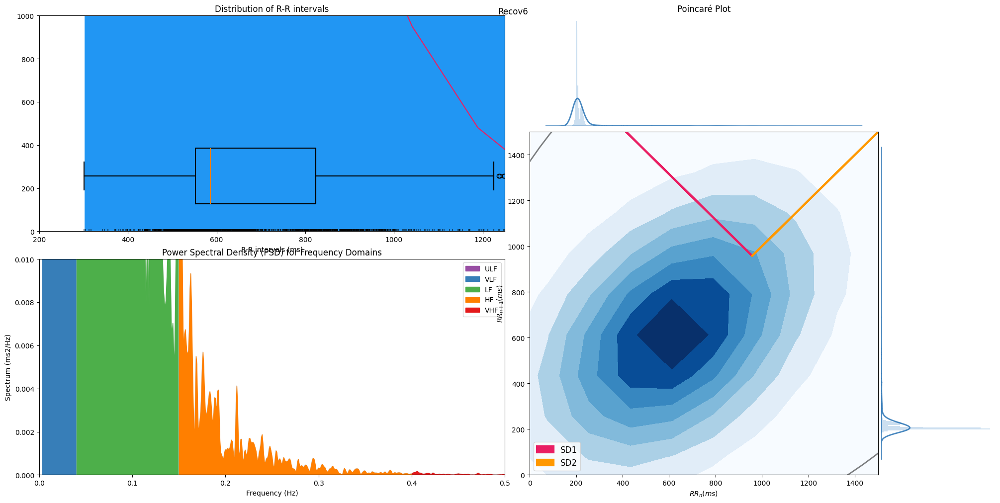

In [57]:
for category in pd.DataFrame({ 'category': dataset['category'] })['category'].unique()[1:]:
    ds = dataset.filter(lambda x, category: x['category'] == category, num_proc=8, fn_kwargs={'category': category})['ECG_Clean']
    peaks, _ = nk.ecg_peaks(ds, sampling_rate=sampling_rate)
    hrv(peaks, sampling_rate=1000, show=True)
    plt.suptitle(category)

In [ ]:
for category in df['category'].unique()[1:]:
    peaks, _ = nk.ecg_peaks(df[df['category'] == category]['ECG_Clean'], sampling_rate=sampling_rate)
    nk.hrv(peaks, sampling_rate=1000, show=True)
    plt.suptitle(category)

### Dataset Preprocessing Speed

In [7]:
dataset.select(range(0, len(dataset), step_size))

Dataset({
    features: ['timestamp', 'signal', 'signal_normalised', 'subject_id', 'category', 'code', 'ECG_Raw', 'ECG_Clean', 'ECG_Rate', 'ECG_Quality', 'ECG_R_Peaks', 'ECG_P_Peaks', 'ECG_P_Onsets', 'ECG_P_Offsets', 'ECG_Q_Peaks', 'ECG_R_Onsets', 'ECG_R_Offsets', 'ECG_S_Peaks', 'ECG_T_Peaks', 'ECG_T_Onsets', 'ECG_T_Offsets', 'ECG_Phase_Atrial', 'ECG_Phase_Completion_Atrial', 'ECG_Phase_Ventricular', 'ECG_Phase_Completion_Ventricular'],
    num_rows: 34768
})

In [ ]:
a = 0
for i in range(0, len(dataset), step_size):
    print(i, "-", a * step_size)
    if a > 20: 
        break
    a += 1

In [24]:
from collections import Counter

In [25]:
def method(data, idxs):
    return {
        'label': [Counter(dataset[idx:idx+n_window]['category']).most_common(1)[0][0] for idx in idxs]
    }

In [35]:
def method(data, idxs):
    from collections import Counter
    return {
        'label': [Counter(dataset.select(range(idx, idx + n_window))['category']).most_common(1)[0][0] for idx in idxs]
    }

In [26]:
len(dataset), len(dataset.select(range(0, len(dataset), step_size)))

(8692000, 34768)

In [36]:
dataset \
    .select(range(0, len(dataset), step_size)) \
    .map(
        method,
        batched=True,
        batch_size=1000,
        with_indices='idxs',
        num_proc=8,
    )

Map (num_proc=8):   0%|          | 0/34768 [00:01<?, ? examples/s]


NameError: name 'dataset' is not defined